In [222]:
using Pkg

In [223]:
Pkg.activate(dirname(pwd()))

  Activating project at `~/Documents/GitHub/ComputationalHeatTransfer.jl`


In [224]:
using ComputationalHeatTransfer
using LaTeXStrings
using JLD2
using Plots
gr()  


Plots.GRBackend()

## Control Console

In [362]:
Rn = 2e-6
δfilm = 1e-5
ad_fac = 1.3
plate_d = 1.5e-3;
Eratio = 0.3

0.3

In [363]:
fluid_type = "Butane"
Tref = 291.2

291.2

In [364]:
power = 40 #watts
hc = 2500.0
Tc = Tref;

# Properies

### Solid Physical parameters

In [365]:
ρₛ = 2730; # density
cₛ  = 8.93e02; # specific heat
kₛ  = 1.93e02; # heat conductivity
params = HeatConductionParameters(ρₛ ,cₛ ,kₛ ,thickness=plate_d)

HeatConductionParameters(2730.0, 893.0, 193.0, 7.916682048820907e-5, 0.0015)

### Fluid Physical parameters

In [366]:
p_fluid = SaturationFluidProperty(fluid_type,Tref);

# Plate Conduction

### Geometry parameters

In [367]:
Lx = 0.1524; # plate size x
Ly = 0.0648; # plate size y

In [368]:
xlim = (-Lx/2,Lx/2) # plate x limits
ylim = (-Ly/2,Ly/2) # plate y limits
Δx,Δt_max = setstepsizes(params.α,gridPe=8.0,fourier=0.3)

(0.0006333345639056725, 0.001520002953373614)

## Set up the OHP

In [369]:
OHPtype = "ASETS-II OHP 1 LARGE HEATER"

"ASETS-II OHP 1 LARGE HEATER"

In [370]:
eparams,cparams = OHPConfiguration(OHPtype,power,Tc,hc,Δx,hc2ratio=1/10);

In [371]:
x, y, xf, yf = construct_ohp_curve("ASETS",Δx)
ohp = BasicBody(x,y)
ohpgeom = ComputationalHeatTransfer.LineSourceParams(ohp)

LineSourceParams{BasicBody{4877, RigidBodyTools.ClosedBody}}(Basic pointwise-specified body with 4877 points
   Current position: (0.0,0.0)
   Current angle (rad): 0.0
)

In [372]:
# plot(ohpgeom.body,fillalpha=0,linecolor=:blue,xlims=xlim,ylims=ylim,framestyle = :box)

### create HeatConduction system

In [373]:
sys = HeatConduction(params,Δx,xlim,ylim,Δt_max,qline=ohpgeom,qflux=eparams,qmodel=cparams)

Unbounded Heat conduction system on a grid of size 250 x 108 and 0 static immersed points


# OHP inner part

### Tube geometries

In [374]:
tube_d = 1e-3; # tube diameter
peri = 4*tube_d # Tube perimeter
Ac = tube_d*tube_d # tube cross-sectional area
L2D = 133.83*1e-3 # the actual length of the bended pipe in the real world
L = (sys.qline[1].arccoord[1] + sys.qline[1].arccoord[end])  # total length of the pipe when streched to a 1D pipe (an approximate here)
angle = 0*pi/2 # inclination angle 
closedornot = true

N=numpts(ohp);

In [375]:
tube = Tube(tube_d,peri,Ac,L,L2D,angle,gravity,closedornot,N,fluid_type);

### Liquid

In [376]:
Nu = 3.60
Hₗ = p_fluid.kₗ/tube_d * Nu # Nusselt number 4.36

387.3775707791756

In [377]:
X0,realratio = randomXp(tube)
# X0 = [(1.0,2.0)]
dXdt0_l = zeros(length(X0))
dXdt0_r = zeros(length(X0))
dXdt0 = map(tuple,dXdt0_l,dXdt0_r);

In [378]:
realratio

0.38608730039850087

In [379]:
# construct liquids
N=numpts(ohp)
Xarrays,θarrays = constructXarrays(X0,N,Tref,L);

In [380]:
liquids=Liquid(Hₗ,p_fluid.ρₗ,p_fluid.Cpₗ,p_fluid.αₗ,p_fluid.μₗ,p_fluid.σ,X0,dXdt0,Xarrays,θarrays);

### Vapor

In [381]:
Hᵥ = p_fluid.kᵥ/tube_d * Nu # Nusselt number 4.36
# Hᵥ = 0.0 # Nusselt number 4.36

57.21608452726913

In [382]:
P = 0*zeros(length(X0)) .+ TtoP(Tref);
# δ = 0*zeros(length(X0)) .+ 1.0e-5;
δfilm_deposit = δfilm;
δstart = 0*zeros(length(X0)) .+ δfilm ;
δend = 0*zeros(length(X0)) .+ δfilm ;

Lvaporplug = XptoLvaporplug(X0,L,tube.closedornot)
Lfilm_start = 0.01 .* Lvaporplug
Lfilm_end = 0.01 .* Lvaporplug
# Eratio = 0.75
# δratio = 0*zeros(length(X0)) .+ 0.99;
# δ = 0*zeros(length(X0)) .+ 2.78E-02;
δmin = 2e-6
vapors=Vapor(Hᵥ,p_fluid.kₗ,δmin,Eratio,P,δfilm_deposit,δstart,δend,Lfilm_start,Lfilm_end);

In [383]:
Lvaporplug

30-element Vector{Float64}:
 0.0839246443071966
 0.0996936072890362
 0.08657598920242116
 0.10384919188258035
 0.09750810440073554
 0.09153503381250605
 0.10377577249281345
 0.09641512759039816
 0.1166470482701838
 0.12164424987978606
 0.07546322261399752
 0.1148169218833619
 0.04735857576374514
 ⋮
 0.0910192435740722
 0.12536010959934707
 0.07881593036004553
 0.06721906987546689
 0.11051054163940144
 0.11615942541235036
 0.11987975395438433
 0.08604471997789442
 0.04572123492646796
 0.11105735340466083
 0.07496040591091813
 0.08751134228109869

### Wall

### nucleate boiling sites

In [384]:
ΔTthres = RntoΔT(Rn,Tref,fluid_type,tube_d)

2.0917312370891676

In [385]:
nucleatenum = 250
Xstations = sort(rand(nucleatenum) .* L);

In [386]:
boil_type = "wall T"
boil_interval = 0.01
Xwallarray,θwallarray = constructXarrays(sys.qline[1].arccoord,L,Tref);
θwallarray .= Tref

wall = Wall(boil_type,boil_interval,Rn,Xstations,Xwallarray,θwallarray);

In [387]:
sys0_nomapping = PHPSystem_nomapping(tube,liquids,vapors,wall);
θ_interp_walltoliquid, θ_interp_liquidtowall, H_interp_liquidtowall, P_interp_liquidtowall = sys_interpolation(sys0_nomapping)
mapping = Mapping(θ_interp_walltoliquid, θ_interp_liquidtowall, H_interp_liquidtowall, P_interp_liquidtowall);

In [388]:
sys0 = PHPSystem(tube,liquids,vapors,wall,mapping);

### construct state vector U

In [389]:
Lvaporplug = XptoLvaporplug(X0,sys0.tube.L,sys0.tube.closedornot)
M = getMvapor(sys0)

u=[XMδLtovec(X0,dXdt0,M,δstart,δend,Lfilm_start,Lfilm_end); liquidθtovec(sys0.liquid.θarrays)];
# u=[XMδtovec(X0,dXdt0,M,δ); liquidθtovec(sys0.liquid.θarrays)];

In [390]:
function immersedboundary_condition(u,t,integrator)
    true
end

immersedboundary_condition (generic function with 1 method)

In [391]:
function immersedboundary_affect!(integrator)
    integrator.p.wall.θarray = deepcopy(temperature_linesource(Main.integrator_plate))
end

immersedboundary_affect! (generic function with 1 method)

In [392]:
cb_boiling =  DiscreteCallback(boiling_condition,boiling_affect!)
cb_vapormerging =  DiscreteCallback(merging_condition,merging_affect!)
cb_liquidmerging = DiscreteCallback(vaporMergingCondition,vaporMergingAffect!)
cb_fixdx =  DiscreteCallback(fixdx_condition,fixdx_affect!)
cbst = CallbackSet(cb_fixdx,cb_boiling,cb_vapormerging,cb_liquidmerging);

# combine inner tube and plate together

In [393]:
tspan = (0.0, 30.0);
num_data = 300
dt_record = tspan[2] /num_data;

tstep = 5e-4

0.0005

In [394]:
u0 = newstate(sys)
integrator_plate = init(u0,tspan,sys)
temperature(integrator_plate) .= Tref;

In [395]:
p = sys0
u=[XMδLtovec(X0,dXdt0,M,δstart,δend,Lfilm_start,Lfilm_end); liquidθtovec(sys0.liquid.θarrays)];
prob = ODEProblem(ODE_innertube, u, tspan, p)
integrator_tube = init(prob, RK4(),save_on=false, dt=tstep, callback=cbst);
currentsys = getcurrentsys(integrator_tube.u,integrator_tube.p);
currentsys.wall.θarray = deepcopy(temperature_linesource(integrator_plate));

## Resume

In [396]:
# integrator_plate = integrator_plate_temp;

In [397]:
# integrator_tube = tube_hist[end];

## Start

In [398]:
boil_hist=[]
plate_T_hist = []
tube_hist_u  = []
tube_hist_t = []
tube_hist_θwall = []

Any[]

In [399]:
using Distributed
using ProgressMeter

In [422]:
prob = ODEProblem(ODE_innertube, deepcopy(integrator_tube.u), (integrator_plate.t,integrator_plate.t+tspan[2]-tspan[1]), currentsys)
integrator_tube = init(prob, RK4(),maxiters=1e8,callback=cbst, dt=tstep,save_on=false);

@showprogress for t in tspan[1]:tstep:tspan[2]
# @time for t in tspan[1]:tstep:tspan[1]
     step!(integrator_tube,tstep,true);

        currentsys = deepcopy(getcurrentsys(integrator_tube.u,integrator_tube.p))
        currentsys.wall.θarray = deepcopy(temperature_linesource(integrator_plate))
        integrator_tube.p = deepcopy(currentsys)
        qtmp = deepcopy(sys_to_heatflux(currentsys))
       set_linesource_strength!(sys,qtmp)


     ADI_timemarching!(temperature(integrator_plate),sys,tstep)

    integrator_plate.t += tstep
    
    if (mod(integrator_plate.t,dt_record) < 1e-6) || (mod(-integrator_plate.t,dt_record) < 1e-6)
        push!(plate_T_hist,deepcopy(temperature(integrator_plate))); 
        push!(tube_hist_θwall,deepcopy(integrator_tube.p.wall.θarray))
        push!(tube_hist_u,deepcopy(integrator_tube.u));
        push!(tube_hist_t,deepcopy(integrator_tube.t));
        integrator_plate_temp = deepcopy(integrator_plate)
#         println(sys.qline[1].q[1:5])
    end
    
end
# integrator_plate.t

Progress:   0%|                                         |  ETA: 1:16:19

LoadError: InterruptException:

In [423]:
boil_hist

383-element Vector{Any}:
 [87.0, 0.7999999999999673]
 [85.0, 0.8499999999999618]
 [65.0, 0.9199999999999541]
 [190.0, 0.9199999999999541]
 [188.0, 0.9399999999999519]
 [180.0, 0.9799999999999475]
 [43.0, 1.1499999999999289]
 [81.0, 1.1499999999999289]
 [132.0, 1.22999999999992]
 [132.0, 1.2599999999999167]
 [180.0, 1.2599999999999167]
 [3.0, 6.0699999999993555]
 [15.0, 6.0699999999993555]
 ⋮
 [5.0, 13.610000000005142]
 [146.0, 13.610000000005142]
 [245.0, 13.610000000005142]
 [132.0, 13.630000000005166]
 [241.0, 13.630000000005166]
 [27.0, 13.670000000005215]
 [46.0, 13.680000000005228]
 [15.0, 13.700000000005252]
 [45.0, 13.700000000005252]
 [51.0, 13.730000000005289]
 [231.0, 13.7400000000053]
 [56.0, 13.770000000005338]

In [420]:
integrator_tube.iter

2357

In [421]:
integrator_tube.success_iter

2268

In [408]:
sysfinal = []
for i = 1:length(tube_hist_u)
    sysfinaltemp = deepcopy(getcurrentsys(tube_hist_u[i],integrator_tube.p))
    sysfinaltemp.wall.θarray = tube_hist_θwall[i]
    push!(sysfinal, sysfinaltemp)
end

In [409]:
sysfinal[1].vapor.δstart

30-element Vector{Float64}:
 1.0122112438245308e-5
 1.0116081404232287e-5
 1.0116621290274264e-5
 1.011123876108728e-5
 8.288914027973925e-6
 9.354474084866718e-6
 8.125476346060115e-6
 6.708744863429596e-6
 7.2998413741386605e-6
 8.772941140711293e-6
 1.0112268943660696e-5
 1.005854923951889e-5
 9.016250358489389e-6
 ⋮
 1.0138351835270443e-5
 1.013725539497539e-5
 8.288801091810591e-6
 8.655774052776138e-6
 9.994803812568296e-6
 9.062939555154197e-6
 9.80297217186246e-6
 1.0134643602472325e-5
 9.555363062230518e-6
 1.0123808481157513e-5
 9.33047293497195e-6
 9.52370303852074e-6

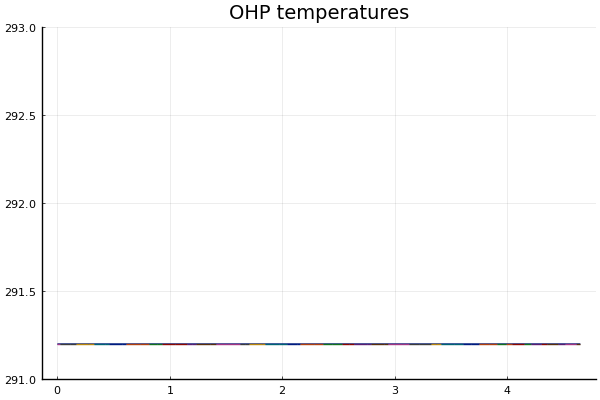

In [410]:
plot(sys0,ylim=(291,293))

┌ Info: Saved animation to /Users/yuxuanli/Documents/GitHub/ComputationalHeatTransfer.jl/notebooks/slug_fps15.gif
└ @ Plots /Users/yuxuanli/.julia/packages/Plots/kYFLA/src/animation.jl:149


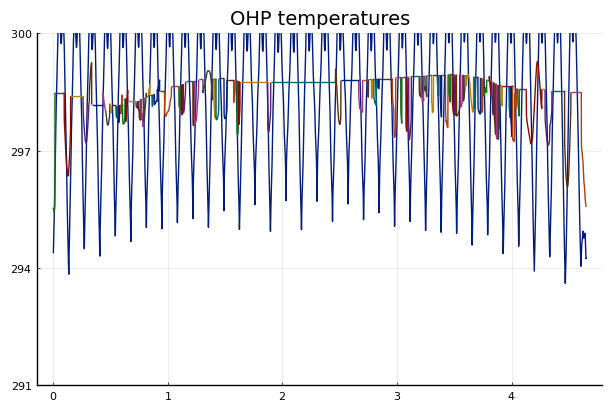

Plots.AnimatedGif("/Users/yuxuanli/Documents/GitHub/ComputationalHeatTransfer.jl/notebooks/slug_fps15.gif")
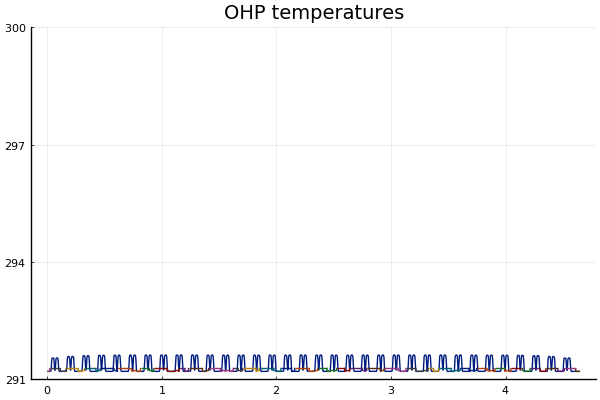

In [411]:
anim = @animate for i=1:length(sysfinal)
    plot(sysfinal[i],ylim=(291,300))
end
gif(anim, "slug_fps15.gif", fps = 10)

┌ Info: Saved animation to /Users/yuxuanli/Documents/GitHub/ComputationalHeatTransfer.jl/notebooks/slug_fps15.gif
└ @ Plots /Users/yuxuanli/.julia/packages/Plots/kYFLA/src/animation.jl:149


Plots.AnimatedGif("/Users/yuxuanli/Documents/GitHub/ComputationalHeatTransfer.jl/notebooks/slug_fps15.gif")
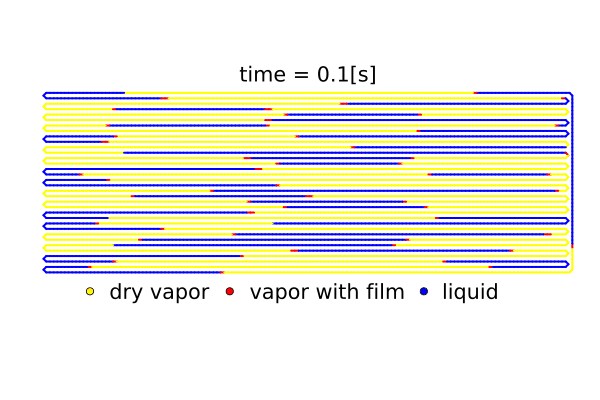

In [412]:
gr()
Hₗ = sysfinal[1].liquid.Hₗ
adjust = 1e-2;

anim = @animate for i=1:length(sysfinal)
    Htmp = sys_to_Harray(sysfinal[i])
    Htmp_marker = round.(div.(Htmp,Hₗ-1e-10))
    plot(ohp,clim=(0,2),fillalpha=0,linewidth=2.0,linecolor=palette([:yellow,  :blue, :red]),
        line_z=Htmp_marker,xlabel="x ",ylabel="y ",border=:none,axis=nothing,bbox_inches="tight")
        annotate!(0.0, 0.028, string("time = ", round(tube_hist_t[i], digits=2), "[s]"), :black,legend=false)
    scatter!([-0.066+adjust],[-0.028],color=:yellow);scatter!([-0.03+adjust],[-0.028],color=:red);scatter!([0.02+adjust],[-0.028],color=:blue);
    annotate!(-0.05+0.002+adjust, -0.028, "dry vapor", :black)
    annotate!(-0.01+0.005+adjust, -0.028, "vapor with film", :black)
    annotate!(0.03+0.002+adjust, -0.028, "liquid", :black)
end
gif(anim, "slug_fps15.gif", fps = 10)

In [413]:
cp = cparams[1]

PrescribedHeatModelRegion{Rectangle{186, RigidBodyTools.Unshifted}}(2500.0, 291.2, Rectangular body with 186 points and half-lengths (0.01397,0.0324)
   Current position: (-0.0635,-0.0)
   Current angle (rad): 0.0
)

┌ Info: Saved animation to /Users/yuxuanli/Documents/GitHub/ComputationalHeatTransfer.jl/notebooks/temperature_fps15.gif
└ @ Plots /Users/yuxuanli/.julia/packages/Plots/kYFLA/src/animation.jl:149


Plots.AnimatedGif("/Users/yuxuanli/Documents/GitHub/ComputationalHeatTransfer.jl/notebooks/temperature_fps15.gif")
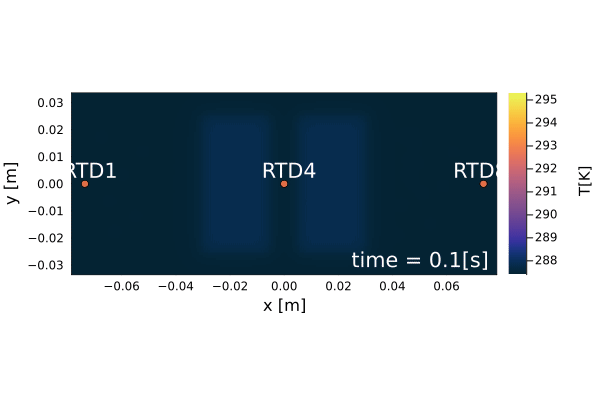

In [319]:
    x = [-2.9inch,-1.4inch,-0.8inch,0.0,0.0,0.8inch,1.4inch,2.9inch]
    y = [0.0,0.0,0.0,0.0,0.4inch,0.0,0.0,0.0];
gr()
Tmax = maximum(plate_T_hist[end]) .- 3.8
Tmin = minimum(plate_T_hist[1]) .- 3.8
xlim = integrator_plate.p.grid.xlim[1]
ylim = integrator_plate.p.grid.xlim[2]

anim = @animate for i = 1:1:length(sysfinal)
# anim = @animate for i = 1:1:1
# @gif for i = 1:1:1
heatmap(plate_T_hist[i].- 3.8,sys.grid,legend=true,color=cgrad(:thermal),
        xlimit=xlim,ylimit=ylim,clim=(Tmin,Tmax),line_z=0,xlabel="x [m]",ylabel="y [m]",
        colorbar_title = "\n T[K]",right_margin = 5Plots.mm)
#     plot!(cparams[1].body)
#     plot!(cparams[2].body)
#     plot!(ohp,clim=(0,2),fillalpha=0,linewidth=2.0,linecolor=palette([:yellow,  :blue, :red]),
#         line_z=0,xlabel="x ",ylabel="y ",border=:none,axis=nothing,bbox_inches="tight")
#         annotate!(0.0, 0.028, string("time = ", round(tube_hist_t[i], digits=2), "[s]"), :black,legend=false)
   
scatter!([x[1],x[4],x[8]],[y[1],y[4],y[8]])
annotate!(x[1]+0.002, y[1]+0.005, "RTD1", :white)
annotate!(x[4]+0.002, y[4]+0.005, "RTD4", :white)
annotate!(x[8]-0.001, y[8]+0.005, "RTD8", :white)
annotate!(0.05, -0.028, string("time = ", round(tube_hist_t[i], digits=2), "[s]"), :white,legend=false)

end
gif(anim, "temperature_fps15.gif", fps = 30)

In [414]:
using XLSX
# namei = "20190604_F_PD_%23005_O002_H001_P010_expA.xlsx"
# namei = "20190606_F_PD_%23006_O002_H001_P020_expA.xlsx"
# namei = "20190612_F_PD_%23007_O002_H001_P030_expA.xlsx"
# namei = "20190613_F_PD_%23008_O002_H001_P040_expA.xlsx"
namei = "20190613_F_PD_%23004_O001_H001_P040_expA.xlsx"
# namei = "20190612_F_PD_%23003_O001_H001_P030_expA.xlsx"
# namei =     "20190604_F_PD_%23001_O001_H001_P010_expA.xlsx";
#  namei =    "20190606_F_PD_%23002_O001_H001_P020_expA.xlsx";

xf = XLSX.readxlsx(dirname(dirname(dirname(pwd())))*"/OHPexp/"*namei)
    Onum, Hnum, power_exp = getconfig(namei)
    RTD,RTDt = getRTD(xf,Onum);

In [415]:
    
    x = [-2.9inch,-1.4inch,-0.8inch,0.0,0.0,0.8inch,1.4inch,2.9inch]
    y = [0.0,0.0,0.0,0.0,0.4inch,0.0,0.0,0.0];
    X =  VectorData(x,y);
    H = Regularize(X,cellsize(sys),I0=origin(sys.grid))
    g = ScalarData(X);
    ghist = getghist(g,H,plate_T_hist);
    thist = tube_hist_t;

In [416]:
Tᵥ = Tref

291.2

sys:1: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


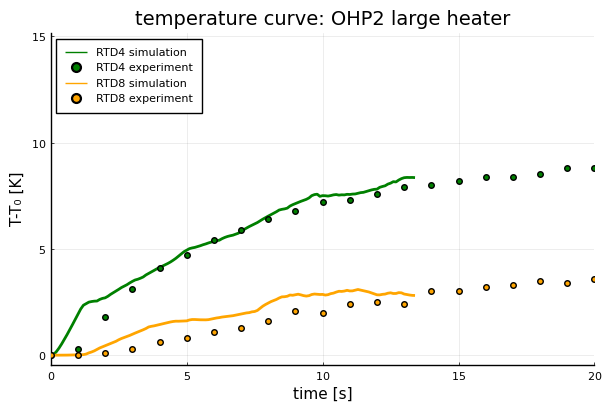

"/Users/yuxuanli/Documents/GitHub/ComputationalHeatTransfer.jl/notebooks/temp_curve.pdf"

In [417]:
pyplot()
# i = 1 #RTD number

# p1 = plot(thist,ghist[i] .-Tᵥ, color=:red, label=string("RTD", i," simulation"),linewidth=2,legend = :topleft)
# scatter!(RTDt .- RTDt[1],RTD[:,i] .- RTD[1,i], color=:red, label=string("RTD", i," experiment"))

i = 4 #RTD number

p1 = plot(thist,ghist[i] .-Tᵥ, color=:green, label=string("RTD", i," simulation"),linewidth=2,legend = :topleft)
scatter!(RTDt .- RTDt[1],RTD[:,i] .- RTD[1,i], color=:green, label=string("RTD", i," experiment"))

i = 8 #RTD number
plot!(thist,ghist[i] .-Tᵥ,color=:orange,label=string("RTD", i," simulation"),linewidth=2)
scatter!(RTDt .- RTDt[1],RTD[:,i] .- RTD[1,i], color=:orange, label=string("RTD", i," experiment"),
    xlabel="time [s]",ylabel="T-T₀ [K]",xlim=(0,20),title=("temperature curve: OHP2 large heater"))

savefig(p1,"temp_curve.pdf")

## Store data

In [ ]:
using JLD2

In [ ]:
boil_station_hist = [elem[1] for elem in boil_hist]
boil_t_hist = [elem[2] for elem in boil_hist]
boil_data = Array(reshape([boil_station_hist;boil_t_hist], length(boil_t_hist),2));

In [ ]:
save(dirname(dirname(dirname(pwd())))*"/OHPnume/OHP4_40W_E030_1_DT1_large.jld2",
    "tube_hist_θwall", tube_hist_θwall,"tube_hist_u", tube_hist_u,"tube_hist_t", tube_hist_t,
    "integrator_tube",integrator_tube,"plate_T_hist", plate_T_hist,
    "integrator_plate", integrator_plate, "boil_data", boil_data,"ohp",ohp)